<a href="https://colab.research.google.com/github/NishatVasker/XAI_-Explainable_AI-/blob/main/Analyzing_and_predicting_Self_Harm_and_Substance_Abuse_Fatalities_with_AutoViz%2C_CatBoost%2C_and_SHAP_Interpretability_in_real_time.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Dataset link: https://www.kaggle.com/datasets/thomaseltonau/self-harm-and-substance-abuse-deaths-worldwide

In [1]:
# Install Python packages using pip.

# The "!pip" command allows you to run shell commands in Jupyter Notebook or Colab cells.
# It is used here to install Python packages.
# The "-q" flag stands for "quiet," which means it will suppress output during installation.
# "feature_engine," "autoviz," and "dataprep" are the packages being installed.
# The "2>/dev/null" part redirects any error messages (stderr) to the null device, effectively silencing them.
# This is often used when you want to hide installation messages.
!pip install -q feature_engine autoviz>=0.1.803 dataprep 2>/dev/null

In [3]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 3.7 MB/s eta 0:00:00


In [5]:
pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 9.3 MB/s eta 0:00:00


In [6]:
# Import necessary libraries
import numpy as np  # Import NumPy for handling numerical operations
import pandas as pd  # Import Pandas for data manipulation and analysis
import warnings  # Import Warnings to suppress unnecessary warnings

# Suppress warning messages
warnings.filterwarnings("ignore")

# Import AutoViz from the autoviz library for automated visualization of data
from autoviz import AutoViz_Class

# Import load_dataset and create_report from the dataprep library for data loading and EDA
from dataprep.datasets import load_dataset
from dataprep.eda import create_report

# Import SHAP for interpreting model predictions
import shap

# Import matplotlib for data visualization
import matplotlib.pyplot as plt

# Import CatBoostRegressor for building a regression model
from catboost import Pool, CatBoostRegressor

# Import mean_squared_error for evaluating model performance
from sklearn.metrics import mean_squared_error

# Import train_test_split for splitting the data into training and testing sets
from sklearn.model_selection import train_test_split

# Import RareLabelEncoder from feature_engine.encoding for encoding categorical features
from feature_engine.encoding import RareLabelEncoder

# Import CountVectorizer from sklearn.feature_extraction.text for text feature extraction
from sklearn.feature_extraction.text import CountVectorizer

# Import ast and re for working with text and regular expressions
import ast
import re

# Set Pandas options to display a maximum of 1000 rows
pd.set_option('display.max_rows', 1000)

In [7]:
%%time
df = pd.read_csv('/content/world_wide_self_harm_and_substance_deaths.csv') # Reads the dataset from a CSV file into a Pandas DataFrame
item0 = df.shape[0]  # Stores the initial number of rows in the DataFrame
df = df.drop_duplicates()  # Removes duplicate rows from the DataFrame
item1 = df.shape[0]  # Stores the number of rows after removing duplicates
print(f"There are {item0-item1} duplicates found in the dataset")  # Prints the number of duplicates that were removed

# select label
df = df[df['Age_and_Sex_Population']>0]
df = df[df['Deaths']>0]
df['log10_deaths_per_million'] = (df['Deaths'] / df['Age_and_Sex_Population']).apply(lambda x: 6+np.log10(x))

# Select only specific columns of interest
selected_cols = ['log10_deaths_per_million', 'Year', 'Cause', 'Age_Range', 'Sex', 'Country']
df = df[selected_cols]

print(df.shape)  # Prints the dimensions (rows and columns) of the filtered DataFrame
df.sample(10).T  # Displays a random sample of 5 rows transposed for better visibility

There are 0 duplicates found in the dataset
(16227, 6)
CPU times: user 70.1 ms, sys: 9.92 ms, total: 80 ms
Wall time: 89.4 ms


,46586,24357,1199,1288,17856,19154,47304,15643,24394,25444
log10_deaths_per_million,-0.364157,1.787786,1.783412,2.090301,1.578939,1.761979,1.79349,1.763862,2.254603,2.442613
Year,2020,2018,2019,2020,2018,2018,2017,2020,2019,2019
Cause,Intentional self-harm,Mental and behavioural disorders due to psychoactive substance use,Mental and behavioural disorders due to psychoactive substance use,Mental and behavioural disorders due to psychoactive substance use,Mental and behavioural disorders due to psychoactive substance use,Intentional self-harm,Intentional self-harm,Mental and behavioural disorders due to psychoactive substance use,Intentional self-harm,Intentional self-harm
Age_Range,5-9,80-84,70-74,15-19,65-69,55-59,85-89,80-84,20-24,55-59
Sex,All,Male,Male,Male,Female,Female,All,Male,Male,Male
Country,Spain,Latvia,Mauritius,Mauritius,Belgium,Czech Republic,Turkey,Republic of Korea,Latvia,Luxembourg


from matplotlib import pyplot as plt
import seaborn as sns
_df_0.groupby(46586).size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_1.groupby(24357).size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_2.groupby(1199).size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_3.groupby(1288).size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp[24357].value_counts()
    for x_label, grp in _df_4.groupby(46586)
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel(46586)
_ = plt.ylabel(24357)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp[1199].value_counts()
    for x_label, grp in _df_5.groupby(24357)
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel(24357)
_ = plt.ylabel(1199)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp[1288].value_counts()
    for x_label, grp in _df_6.groupby(1199)
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel(1199)
_ = plt.ylabel(1288)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp[17856].value_counts()
    for x_label, grp in _df_7.groupby(1288)
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel(1288)
_ = plt.ylabel(17856)

In [11]:
df.columns

df.nunique()

df.describe().T



,count,mean,std,min,25%,50%,75%,max
log10_deaths_per_million,16227.0,1.671354,0.692432,-1.67281,1.291257,1.79912,2.162309,3.853872
Year,16227.0,2018.501448,1.240388,2017.00000,2017.000000,2018.00000,2019.000000,2021.000000


from matplotlib import pyplot as plt
_df_8['mean'].plot(kind='hist', bins=20, title='mean')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_9['std'].plot(kind='hist', bins=20, title='std')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_10['min'].plot(kind='hist', bins=20, title='min')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_11['25%'].plot(kind='hist', bins=20, title='25%')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_12.plot(kind='scatter', x='mean', y='std', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_13.plot(kind='scatter', x='std', y='min', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_14.plot(kind='scatter', x='min', y='25%', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_15.plot(kind='scatter', x='25%', y='50%', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['count']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'count'}, axis=1)
              .sort_values('count', ascending=True))
  xs = counted['count']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_16.sort_values('count', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('count')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['mean']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'mean'}, axis=1)
              .sort_values('mean', ascending=True))
  xs = counted['mean']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_17.sort_values('mean', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('mean')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['std']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'std'}, axis=1)
              .sort_values('std', ascending=True))
  xs = counted['std']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_18.sort_values('std', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('std')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['min']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'min'}, axis=1)
              .sort_values('min', ascending=True))
  xs = counted['min']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_19.sort_values('min', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('min')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_20['mean'].plot(kind='line', figsize=(8, 4), title='mean')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_21['std'].plot(kind='line', figsize=(8, 4), title='std')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_22['min'].plot(kind='line', figsize=(8, 4), title='min')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_23['25%'].plot(kind='line', figsize=(8, 4), title='25%')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_24['mean'].plot(kind='hist', bins=20, title='mean')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_25['std'].plot(kind='hist', bins=20, title='std')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_26['min'].plot(kind='hist', bins=20, title='min')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_27['25%'].plot(kind='hist', bins=20, title='25%')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_28.groupby('index').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_29.plot(kind='scatter', x='mean', y='std', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_30.plot(kind='scatter', x='std', y='min', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_31.plot(kind='scatter', x='min', y='25%', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_32.plot(kind='scatter', x='25%', y='50%', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['count']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'count'}, axis=1)
              .sort_values('count', ascending=True))
  xs = counted['count']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_33.sort_values('count', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('index')):
  _plot_series(series, series_name, i)
  fig.legend(title='index', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('count')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['mean']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'mean'}, axis=1)
              .sort_values('mean', ascending=True))
  xs = counted['mean']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_34.sort_values('mean', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('index')):
  _plot_series(series, series_name, i)
  fig.legend(title='index', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('mean')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['std']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'std'}, axis=1)
              .sort_values('std', ascending=True))
  xs = counted['std']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_35.sort_values('std', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('index')):
  _plot_series(series, series_name, i)
  fig.legend(title='index', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('std')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['min']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'min'}, axis=1)
              .sort_values('min', ascending=True))
  xs = counted['min']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_36.sort_values('min', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('index')):
  _plot_series(series, series_name, i)
  fig.legend(title='index', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('min')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_37['mean'].plot(kind='line', figsize=(8, 4), title='mean')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_38['std'].plot(kind='line', figsize=(8, 4), title='std')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_39['min'].plot(kind='line', figsize=(8, 4), title='min')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_40['25%'].plot(kind='line', figsize=(8, 4), title='25%')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_41['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_41, x='mean', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_42['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_42, x='std', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_43['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_43, x='min', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_44['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_44, x='25%', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

# **Data visualisation**

    Since nrows is smaller than dataset, loading random sample of 10000 rows into pandas...
Shape of your Data Set loaded: (10000, 6)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  2
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  1
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  1
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    5 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Si

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
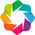

Saving distplots_cats in HTML format
Saving distplots_nums in HTML format


Saving kde_plots in HTML format
AutoViz encountered an error: Unexpected option 'cmap' for Curve type across all extensions. No similar options found.


In [16]:
# Import necessary libraries
from autoviz.AutoViz_Class import AutoViz_Class
import warnings

# Suppress specific warnings from the 'param' library regarding the use of __call__ method
warnings.filterwarnings('ignore', message="Use of __call__ to set options will be deprecated")

# Initialize AutoViz class
AV = AutoViz_Class()

# Specify the filename of the dataset (empty in this case as we are providing a DataFrame directly)
filename = ""
# Specify the target variable for analysis
target_variable = 'log10_deaths_per_million'
# Specify the directory to save custom plots
custom_plot_dir = "custom_plot_directory"

# Perform automated EDA using the AutoViz library
# Parameters are adjusted to reflect your provided dataset and analysis requirements
try:
    dft = AV.AutoViz(
        filename,
        sep=",",
        depVar=target_variable,
        dfte=df,  # Assuming 'df' is your DataFrame variable
        header=0,
        verbose=1,
        lowess=False,
        chart_format="html",
        max_rows_analyzed=min([df.shape[0], 10**4]),
        max_cols_analyzed=min([df.shape[1], 50]),
        save_plot_dir=custom_plot_dir
    )
except Exception as e:
    print(f"AutoViz encountered an error: {e}")

# Ensure to replace `df` with your actual DataFrame variable name if it's different.


In [21]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [23]:
# Import the necessary library for displaying HTML content
from IPython.core.display import display, HTML

# Import the pathlib library to work with file paths
from pathlib import Path

# Initialize an empty list to store file names
file_names = []

# Use pathlib to iterate through HTML files in a specific directory
for file in Path(f'/kaggle/working/{custom_plot_dir}/{target_variable}/').glob('*.html'):

    # Extract the filename from the full path and add it to the list
    filename = str(file).split('/')[-1]
    file_names.append(filename)

# Iterate through the list of file names and display each HTML file
for file_name in file_names:

    # Construct the full file path for each HTML file
    file_path = f'/kaggle/working/{custom_plot_dir}/{target_variable}/{file_name}'

    # Open the HTML file for reading
    with open(file_path, 'r') as file:

        # Read the content of the HTML file
        html_content = file.read()

        # Display the HTML content using IPython
        display(HTML(html_content))

DataPrep Report
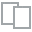
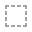
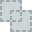
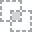
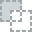
...
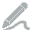
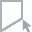
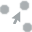
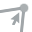
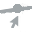

In [29]:
create_report(df.sample(10**3))

# **Data transformation**

In [25]:
df.columns

df.sample(5).T

,16064,24803,21557,29107,29111
log10_deaths_per_million,1.621114,1.968562,0.781661,1.498571,1.779435
Year,2019,2018,2019,2018,2018
Cause,Intentional self-harm,Intentional self-harm,Mental and behavioural disorders due to psychoactive substance use,Mental and behavioural disorders due to psychoactive substance use,Mental and behavioural disorders due to psychoactive substance use
Age_Range,40-44,All,30-34,80-84,All
Sex,Female,Female,Female,Male,Male
Country,Thailand,Lithuania,Germany,Slovakia,Slovakia


In [26]:
%%time

# Select the main label.
main_label = 'log10_deaths_per_million'

# Set up a rare label encoder for selected columns.
for col in df.columns:
    if col != main_label:
        df[col] = df[col].fillna('None').astype(str)
        encoder = RareLabelEncoder(n_categories=1, max_n_categories=120, replace_with='Other', tol=20.0 / df.shape[0])
        df[col] = encoder.fit_transform(df[[col]])

print(df.shape)  # Print the shape of the resulting DataFrame.
df.sample(10).T  # Display a sample of 10 rows, transposed for easier readability.

(16227, 6)
CPU times: user 97.7 ms, sys: 0 ns, total: 97.7 ms
Wall time: 102 ms


,18602,21890,47849,46763,27080,20737,17592,17628,45952,35619
log10_deaths_per_million,1.076618,1.072473,1.495519,0.646971,-0.003678,2.497296,1.613704,2.67956,1.839521,1.092403
Year,2019,2018,2018,2018,2019,2019,2018,2018,2017,2019
Cause,Mental and behavioural disorders due to psychoactive substance use,Mental and behavioural disorders due to psychoactive substance use,Mental and behavioural disorders due to psychoactive substance use,Mental and behavioural disorders due to psychoactive substance use,Intentional self-harm,Mental and behavioural disorders due to psychoactive substance use,Intentional self-harm,Intentional self-harm,Intentional self-harm,Intentional self-harm
Age_Range,35-39,55-59,45-49,30-34,5-9,70-74,20-24,65-69,65-69,10-14
Sex,Male,Male,All,All,Male,Male,Female,Male,All,All
Country,Bulgaria,Greece,United Kingdom,Sweden,Poland,Finland,Belarus,Belarus,Slovakia,Czech Republic


In [32]:
df.info()



<class 'pandas.core.frame.DataFrame'>
Int64Index: 16227 entries, 4 to 48629
Data columns (total 6 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   log10_deaths_per_million  16227 non-null  float64
 1   Year                      16227 non-null  object 
 2   Cause                     16227 non-null  object 
 3   Age_Range                 16227 non-null  object 
 4   Sex                       16227 non-null  object 
 5   Country                   16227 non-null  object 
dtypes: float64(1), object(5)
memory usage: 887.4+ KB


# **Machine learning**

In [33]:
%%time
# Initialize data
# Extract the values of the 'main_label' column and reshape it into a 1D array as 'y'
y = df[main_label].values.reshape(-1,)

# Create the feature matrix 'X' by dropping the 'main_label' column from the DataFrame 'df'
X = df.drop([main_label], axis=1)

# Identify categorical columns in the DataFrame 'df'
# These columns contain non-numeric data
cat_cols = df.select_dtypes(include=['object']).columns

# Create a list of indices for categorical columns in the feature matrix 'X'
cat_cols_idx = [list(X.columns).index(c) for c in cat_cols]

# Split the data into training and testing sets
# - 'X_train' and 'y_train' will contain the training features and labels, respectively
# - 'X_test' and 'y_test' will contain the testing features and labels, respectively
# The split is done with a 50% test size, a random seed of 0, and stratification based on the selected column
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=0, stratify=df[['Cause']])

# Print the dimensions of the training and testing sets
# This provides insight into the sizes of the datasets
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(8113, 5) (8114, 5) (8113,) (8114,)
CPU times: user 85.9 ms, sys: 2.74 ms, total: 88.6 ms
Wall time: 136 ms


In [34]:
%%time

# Initialize the training and testing data pools using CatBoost's Pool class
train_pool = Pool(X_train,
                  y_train,
                  cat_features=cat_cols_idx)  # Create a training data pool with categorical features
test_pool = Pool(X_test,
                 y_test,
                 cat_features=cat_cols_idx)  # Create a testing data pool with categorical features

# Specify the training parameters for the CatBoostRegressor model
model = CatBoostRegressor(iterations=1500,    # Number of boosting iterations
                          depth=5,           # Maximum depth of trees in the ensemble
                          verbose=0,         # Set verbosity level to 0 (no output during training)
                          learning_rate=0.08,  # Learning rate for gradient boosting
                          early_stopping_rounds=10, # Early stopping rounds
                          loss_function='RMSE')  # Loss function to optimize (Root Mean Squared Error)

# Train the CatBoostRegressor model on the training data
model.fit(train_pool, eval_set=test_pool)

# Make predictions using the trained model on both the training and testing data
y_train_pred = model.predict(train_pool)  # Predictions on the training data
y_test_pred = model.predict(test_pool)    # Predictions on the testing data

# Calculate and print the Root Mean Squared Error (RMSE) scores for training and testing data
rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)  # RMSE for training data
rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)     # RMSE for testing data

# Print the rounded RMSE scores
print(f"RMSE score for train {round(rmse_train, 4)} dex, and for test {round(rmse_test, 4)} dex")

RMSE score for train 0.2482 dex, and for test 0.2622 dex
CPU times: user 3.24 s, sys: 248 ms, total: 3.49 s
Wall time: 2.32 s


In [35]:
# Calculate the baseline RMSE (Root Mean Squared Error) scores for the training and test datasets.

# For the training dataset:

# Calculate the RMSE by comparing the actual target values (y_train) with the predicted values,
# where the predicted values are the mean of the training target values repeated for each data sample.
rmse_bs_train = mean_squared_error(y_train, [np.mean(y_train)]*len(y_train), squared=False)

# For the test dataset:

# Calculate the RMSE by comparing the actual target values (y_test) with the predicted values,
# where the predicted values are the mean of the training target values repeated for each test data sample.
rmse_bs_test = mean_squared_error(y_test, [np.mean(y_train)]*len(y_test), squared=False)

# Print the rounded baseline RMSE scores for both the training and test datasets.
print(f"RMSE baseline score for train {round(rmse_bs_train, 4)} dex, and for test {round(rmse_bs_test, 4)} dex")

RMSE baseline score for train 0.6916 dex, and for test 0.6932 dex


# **Explanations with SHAP values**

In [36]:
%matplotlib inline

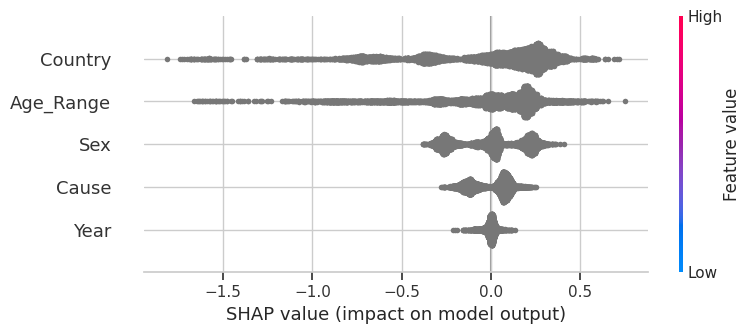

CPU times: user 1.88 s, sys: 295 ms, total: 2.17 s
Wall time: 2.58 s


In [37]:
%%time
# Initialize the SHAP library for visualization
shap.initjs()

# Create a TreeExplainer object for the 'model' (assumes 'model' is a tree-based model like a Random Forest or XGBoost)
ex = shap.TreeExplainer(model)

# Calculate SHAP values for the 'X_test' data using the TreeExplainer
shap_values = ex.shap_values(X_test)

# Generate a summary plot to visualize the impact of features on model predictions
shap.summary_plot(shap_values, X_test)

In [38]:
# Calculate the expected values using a variable named 'ex.expected_value'.
expected_values = ex.expected_value

# Print the average predicted label
print(f"Average predicted deaths is {round(10**expected_values, 2)} per million")

# Print the average actual label from 'y_test'
print(f"Average actual deaths is {round(10**np.mean(y_test), 2)} per million")

Average predicted deaths is 46.86 per million
Average actual deaths is 46.99 per million



Year



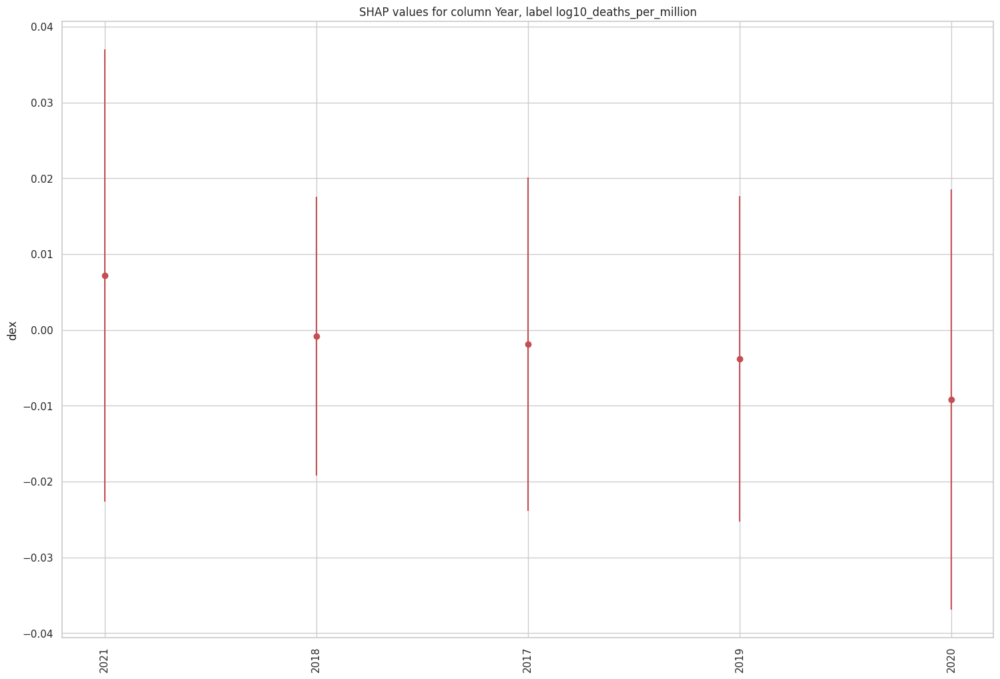

       gain   gain_std  count
col                          
2021  0.0072   0.0298    589 
2018 -0.0008   0.0184   2051 
2017 -0.0019   0.0220   2220 
2019 -0.0038   0.0215   1960 
2020 -0.0092   0.0277   1294 

Cause



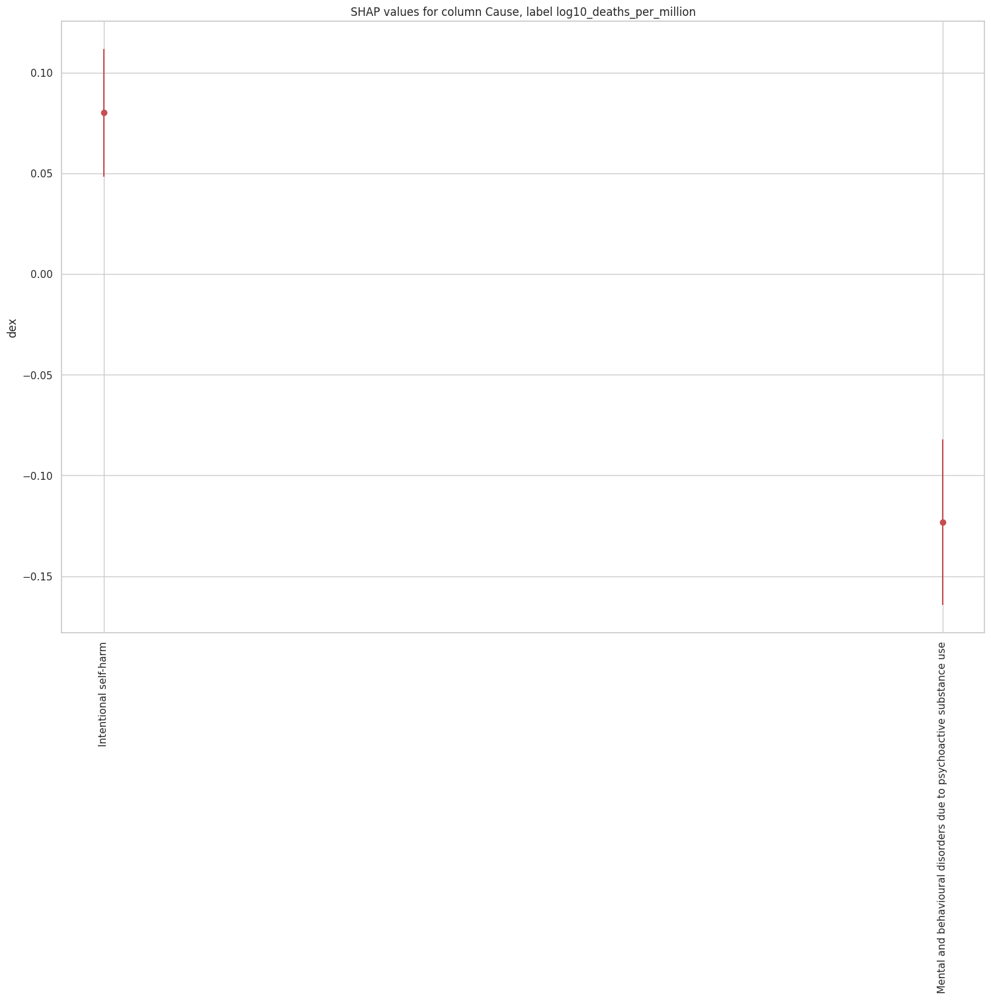

                                                                     gain   \
col                                                                          
Intentional self-harm                                               0.0800   
Mental and behavioural disorders due to psychoactive substance use -0.1232   

                                                                    gain_std  \
col                                                                            
Intentional self-harm                                                0.0317    
Mental and behavioural disorders due to psychoactive substance use   0.0410    

                                                                    count  
col                                                                        
Intentional self-harm                                               4945   
Mental and behavioural disorders due to psychoactive substance use  3169   

Age_Range



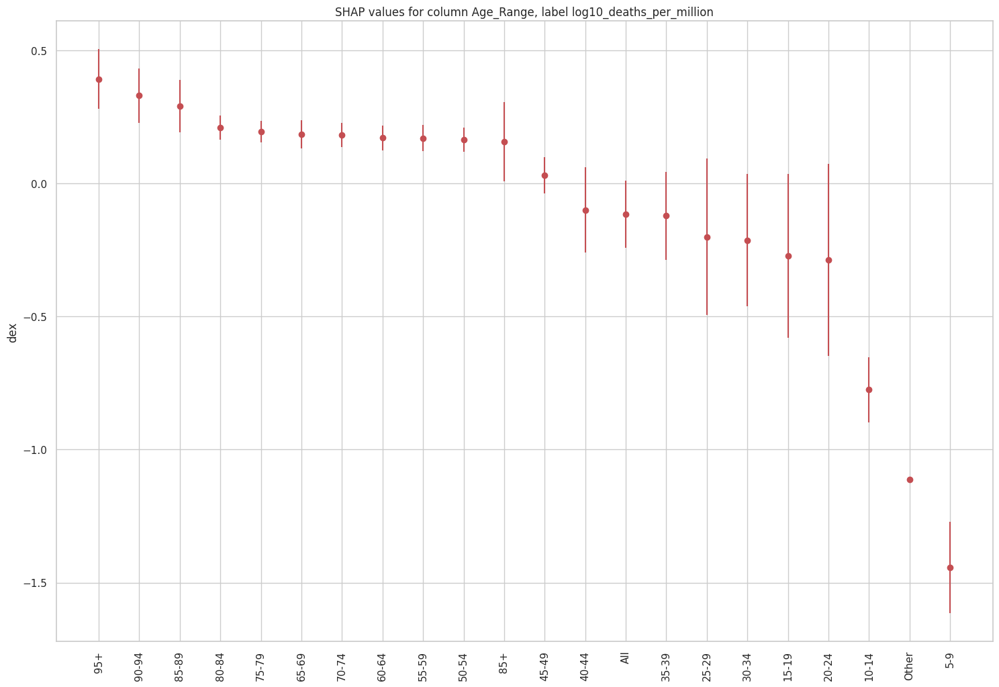

        gain   gain_std  count
col                           
95+    0.3933   0.1114    146 
90-94  0.3305   0.1014    220 
85-89  0.2919   0.0979    272 
80-84  0.2101   0.0456    422 
75-79  0.1945   0.0405    440 
65-69  0.1842   0.0533    481 
70-74  0.1826   0.0452    464 
60-64  0.1717   0.0474    540 
55-59  0.1706   0.0498    515 
50-54  0.1653   0.0458    524 
85+    0.1580   0.1493     44 
45-49  0.0322   0.0680    485 
40-44 -0.0995   0.1608    506 
All   -0.1155   0.1260    717 
35-39 -0.1211   0.1649    461 
25-29 -0.2000   0.2934    421 
30-34 -0.2127   0.2493    489 
15-19 -0.2717   0.3071    323 
20-24 -0.2870   0.3602    374 
10-14 -0.7753   0.1224    218 
Other -1.1130      NaN      1 
5-9   -1.4432   0.1727     51 

Sex



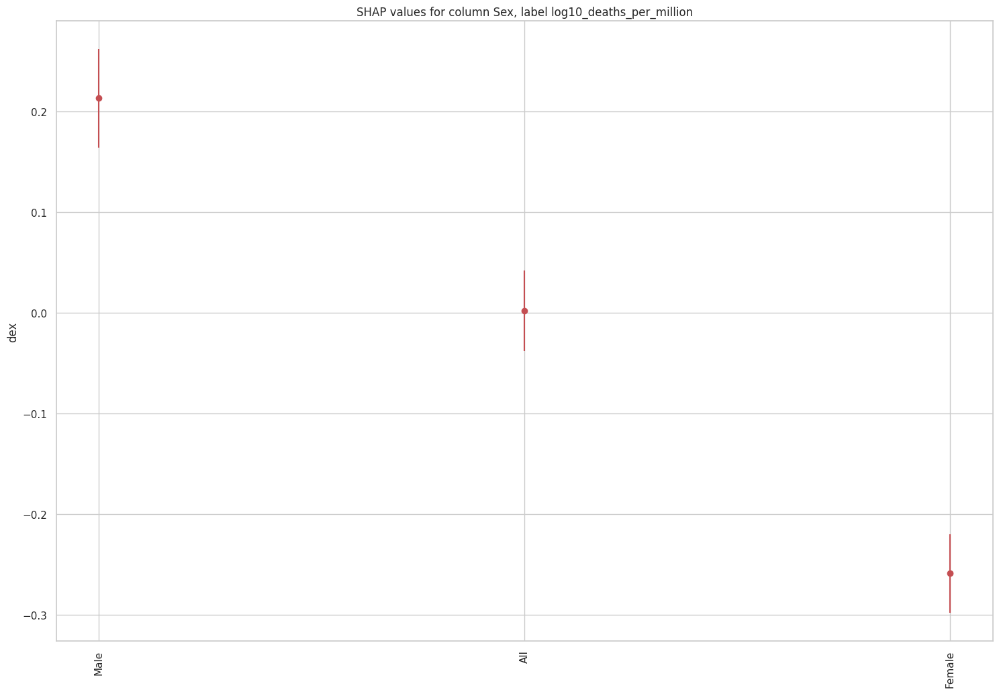

         gain   gain_std  count
col                            
Male    0.2130   0.0487   2796 
All     0.0022   0.0400   2954 
Female -0.2589   0.0393   2364 

Country



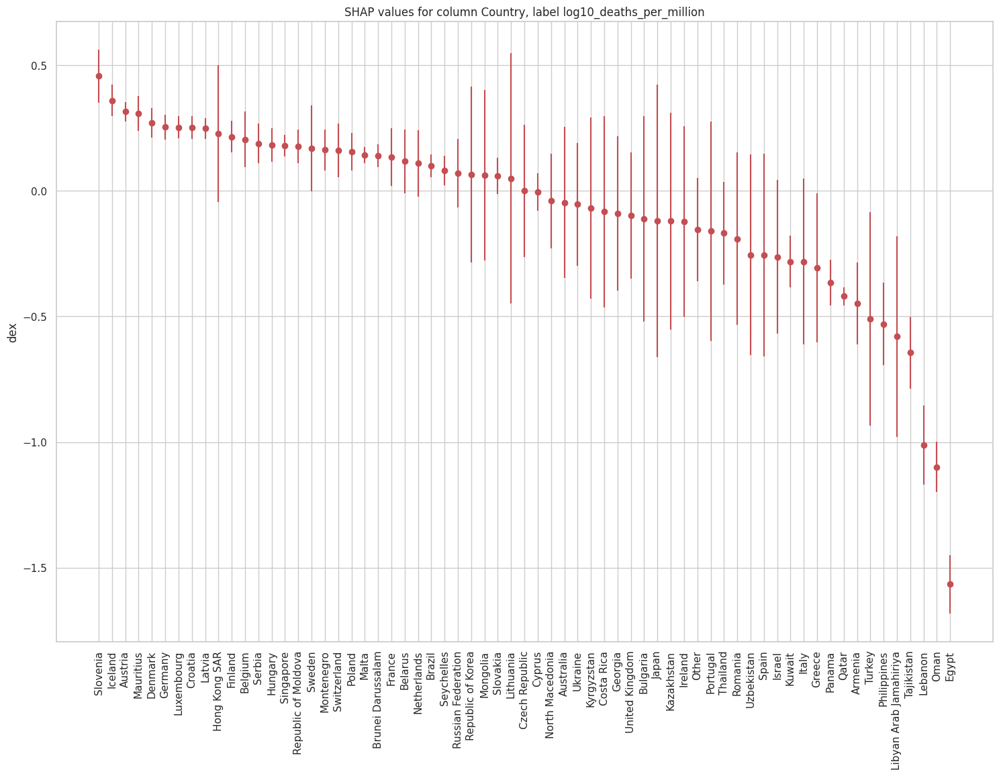

                         gain   gain_std  count
col                                            
Slovenia                0.4563   0.1060    160 
Iceland                 0.3593   0.0628    124 
Austria                 0.3144   0.0396    279 
Mauritius               0.3070   0.0689    173 
Denmark                 0.2700   0.0597    180 
Germany                 0.2538   0.0493    191 
Luxembourg              0.2524   0.0439    187 
Croatia                 0.2511   0.0446    132 
Latvia                  0.2476   0.0425    221 
Hong Kong SAR           0.2276   0.2726     20 
Finland                 0.2150   0.0620    194 
Belgium                 0.2048   0.1105    103 
Serbia                  0.1882   0.0785    246 
Hungary                 0.1820   0.0676    126 
Singapore               0.1799   0.0435    102 
Republic of Moldova     0.1765   0.0673     86 
Sweden                  0.1697   0.1709     94 
Montenegro              0.1627   0.0818     49 
Switzerland             0.1598   0.1072 

In [39]:
# Define a function named 'show_shap' that visualizes SHAP values for a specific feature.
# Parameters:
#   - col: The name of the feature for which SHAP values will be visualized.
#   - shap_values: SHAP values calculated for the model's predictions.
#   - label: The label to be displayed in the plot title.
#   - X_test: The DataFrame containing the test data.
#   - ylabel: The label for the y-axis in the plot (default is 'points').
def show_shap(col, shap_values=shap_values, label=main_label, X_test=X_test, ylabel='dex'):
    # Create a copy of the test data DataFrame.
    df_infl = X_test.copy()

    # Add a new column 'shap_' to the DataFrame containing SHAP values for the specified feature.
    df_infl['shap_'] = shap_values[:, df_infl.columns.tolist().index(col)]

    # Calculate the mean SHAP values and standard deviation grouped by the specified feature.
    gain = round(df_infl.groupby(col)['shap_'].mean(), 4)
    gain_std = round(df_infl.groupby(col)['shap_'].std(), 4)

    # Count the number of data points for each category of the specified feature.
    cnt = df_infl.groupby(col)['shap_'].count()

    # Create a dictionary containing the feature, mean SHAP values, standard deviation, and count.
    dd_dict = {'col': list(gain.index), 'gain': list(gain.values), 'gain_std': list(gain_std.values), 'count': cnt}

    # Create a DataFrame from the dictionary and sort it by 'gain' in descending order.
    df_res = pd.DataFrame.from_dict(dd_dict).sort_values('gain', ascending=False).set_index('col')

    # Replace "$" by "*" to use in matplotlib
    if any([('$' in str(idx)) for idx in set(df_res.index)]):
        print('Replacing "$" by "*" to use in matplotlib')
        df_res.index = [c.replace('$','*') for c in df_res.index]


    # Create a plot to visualize the SHAP values with error bars.
    plt.figure(figsize=(18, 12))
    plt.errorbar(df_res.index, df_res['gain'].values, yerr=df_res['gain_std'].values, fmt="o", color="r")

    # Set plot title and axis labels.
    plt.title(f'SHAP values for column {col}, label {label}')
    plt.ylabel(ylabel)
    plt.tick_params(axis="x", rotation=90)

    # Display the plot and the DataFrame with results.
    plt.show()
    print(df_res)

    # Return the function.
    return

# Loop through the columns in the test data.
for col in X_test.columns:
    print()  # Print an empty line for better readability.
    print(col)  # Print the name of the current column.
    print()  # Print another empty line for separation.

    # Call the 'show_shap' function to visualize SHAP values for the current column.
    show_shap(col, shap_values, label=main_label, X_test=X_test)

In [45]:
import pandas as pd

# Load the dataset
file_path = '/content/world_wide_self_harm_and_substance_deaths.csv'
data = pd.read_csv(file_path)

# Display the first few rows to understand the structure
print(data.head())


   Year         Cause          Age_Range ISO_Code   Sex    Deaths  \
0  2017  Intentional self-harm        0     GBR    Female     0     
1  2017  Intentional self-harm        0     GBR      Male     0     
2  2017  Intentional self-harm        1     GBR    Female     0     
3  2017  Intentional self-harm        1     GBR      Male     0     
4  2017  Intentional self-harm    10-14     GBR    Female    16     

   Age_and_Sex_Population     Country      
0          743552.0        United Kingdom  
1          782850.0        United Kingdom  
2          768444.0        United Kingdom  
3          810126.0        United Kingdom  
4         3640314.0        United Kingdom  


In [56]:
print(X.dtypes)


Age_Range                  object
ISO_Code                   object
Sex                        object
Deaths                      int64
Age_and_Sex_Population    float64
Country                    object
dtype: object


In [64]:
pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=80d0dc65752c646de3ed51c37bb9e8ec003fb0eb7fa19d5d3305924d3118c008
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [69]:
!pip install gradio pandas numpy scikit-learn shap


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.7/16.7 MB 40.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 305.2/305.2 kB 39.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.9/75.9 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 394.2/394.2 kB 45.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 61.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.7/60.7 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 60.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 9.1 MB/s

In [71]:
pip install gradio

In [75]:
!pip install --upgrade typing_extensions


In [ ]:
import os
os._exit(00)


In [2]:
import gradio as gr
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import shap

# Generating dummy data for demonstration
np.random.seed(42) # For reproducibility
data = pd.DataFrame({
    'Year': np.random.randint(1990, 2020, 100),
    'Substance_Deaths': np.random.randint(100, 1000, 100),
    'Population': np.random.randint(100000, 1000000, 100),
    'GDP_Per_Capita': np.random.rand(100) * 50000,
    'Self_Harm_Deaths': np.random.randint(50, 500, 100) # Target variable
})

# Splitting the dataset
X = data[['Year', 'Substance_Deaths', 'Population', 'GDP_Per_Capita']]
y = data['Self_Harm_Deaths']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Training a Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# SHAP Explainer
explainer = shap.Explainer(model.predict, X_train)
shap_values = explainer(X_test)

# Prediction and Explanation function for Gradio App
def predict_and_explain(year, substance_deaths, population, gdp_per_capita):
    # Preparing input data for the model
    input_data = np.array([[year, substance_deaths, population, gdp_per_capita]])

    # Making predictions
    prediction = model.predict(input_data)[0]

    # Generating SHAP values for the input data
    shap_values = explainer(input_data)

    # Generating SHAP plot (waterfall plot for the first prediction)
    shap_plot = shap.plots.waterfall(shap_values[0], show=False)

    return prediction, shap_plot

# Defining Gradio Interface
iface = gr.Interface(
    fn=predict_and_explain,
    inputs=[
        gr.Number(label="Year"),
        gr.Number(label="Substance Deaths"),
        gr.Number(label="Population"),
        gr.Number(label="GDP Per Capita")
    ],
    outputs=[
        gr.Text(label="Predicted Self-Harm Deaths"),
        gr.Image(label="SHAP Explanation")
    ],
    title="Predict Self-Harm Deaths with SHAP Explanation"
)

# Launching the Gradio App
iface.launch()


Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://1661f70c706a5b6970.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


In [3]:
!pip install gradio pandas numpy scikit-learn shap matplotlib


# **How It Works in real time :**

This code trains a linear regression model on dummy data mimicking the structure you're interested in.

The predict_and_explain function makes a prediction based on the input features and generates a SHAP explanation for that prediction.

It then plots the SHAP explanation, saves the plot as an image to a temporary file, and returns both the prediction and the path to the image.

The Gradio interface displays the prediction and the SHAP plot image.



**Year:** This should be a year within the range used in the dummy data, which is between 1990 and 2020. You can choose any year within this range, for example, 2005.

**Substance Deaths:** The number of deaths due to substance abuse, which, in the dummy data, is randomly generated between 100 and 1000. You can input any value within this range, for example, 500.

**Population:** The population figure, where the dummy data uses values between 100,000 and 1,000,000. Thus, a value like 500,000 would be a reasonable test input.

**GDP Per Capita:** data, GDP per capita values are generated as random floats multiplied by 50,000, resulting in a range roughly between 0 and 50,000. You can input a value like 25,000 for testing.

# **Example Test Inputs**
Year: 2005

Substance Deaths: 500

Population: 500,000

GDP Per Capita: 25,000

These values are meant for demonstration purposes and to test the functionality of the Gradio app with the linear regression model and the SHAP explanation. The actual predictive value and the explanation generated will depend on the model's training, which, in this case, is on randomly generated data. For more meaningful insights and predictions, you would need to train the model on your actual dataset.

In [7]:
import gradio as gr
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import shap
import matplotlib.pyplot as plt

# Generating dummy data
np.random.seed(42)
data = pd.DataFrame({
    'Year': np.random.randint(1990, 2020, 100),
    'Substance_Deaths': np.random.randint(100, 1000, 100),
    'Population': np.random.randint(100000, 1000000, 100),
    'GDP_Per_Capita': np.random.rand(100) * 50000,
    'Self_Harm_Deaths': np.random.randint(50, 500, 100)  # Target variable
})

# Splitting the dataset
X = data[['Year', 'Substance_Deaths', 'Population', 'GDP_Per_Capita']]
y = data['Self_Harm_Deaths']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Training a Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# SHAP Explainer
explainer = shap.Explainer(model.predict, X_train)

# Prediction and Explanation function for Gradio App
def predict_and_explain(year, substance_deaths, population, gdp_per_capita):
    input_data = np.array([[year, substance_deaths, population, gdp_per_capita]])
    prediction = model.predict(input_data)[0]

    # Generating SHAP values for the input data
    shap_values = explainer(input_data)

    # Generating SHAP plot
    plt.figure()
    shap.plots.waterfall(shap_values[0], max_display=14, show=False)
    plt.tight_layout()
    plot_path = "/tmp/shap_plot.png"
    plt.savefig(plot_path)
    plt.close()

    return prediction, plot_path

# Defining Gradio Interface
iface = gr.Interface(
    fn=predict_and_explain,
    inputs=[gr.Number(label="Year"), gr.Number(label="Substance Deaths"),
            gr.Number(label="Population"), gr.Number(label="GDP Per Capita")],
    outputs=[gr.Text(label="Predicted Self-Harm Deaths"), gr.Image(label="SHAP Explanation")],
    title="Real time Predict Self-Harm Deaths with SHAP Explanation"
)

# Launching the Gradio App
iface.launch()


Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://fbd42a50c12c21f68a.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


In [8]:
import gradio as gr
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import shap
import matplotlib.pyplot as plt

# Adjusting the dummy data generation for the current context
np.random.seed(42)
data = pd.DataFrame({
    'Year': np.random.randint(2000, 2024, 100),  # Updated year range to include up to 2023
    'Substance_Deaths': np.random.randint(100, 1000, 100),
    'Population': np.random.randint(100000, 1000000, 100),
    'GDP_Per_Capita': np.random.rand(100) * 50000,
    'Self_Harm_Deaths': np.random.randint(50, 500, 100)  # Target variable
})

# Splitting the dataset
X = data[['Year', 'Substance_Deaths', 'Population', 'GDP_Per_Capita']]
y = data['Self_Harm_Deaths']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Training a Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# SHAP Explainer
explainer = shap.Explainer(model.predict, X_train)

# Function to generate and display SHAP summary plot
def generate_shap_summary():
    shap_values = explainer(X_test)

    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values, X_test, show=False)
    plt.tight_layout()
    plot_path = "/tmp/shap_summary_plot.png"
    plt.savefig(plot_path)
    plt.close()

    return plot_path

# Gradio interface
iface = gr.Interface(
    fn=generate_shap_summary,
    inputs=[],
    outputs=gr.Image(label="SHAP Summary Plot"),
    title="Model Explanation with SHAP Summary Plot"
)

# Launching the Gradio App
iface.launch()


Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://360a3747ca62569a67.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
